In [36]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import LabelEncoder
from statsmodels.stats.outliers_influence import variance_inflation_factor
from scipy.stats import zscore
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import power_transform
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn import metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error

In [2]:
df=pd.read_csv("carPrediction.csv")
df

,Unnamed: 0,Brand,Model,Variant,ManufactureYr,Fuel type,Control,DrivenKms,Price
0,0,Hyundai,i20,1.4 Sportz,2017,Diesel,Manual,"49,197",6.25
1,1,Hyundai,Creta,1.6 VTVT SX Plus,2018,Petrol,Manual,"26,985",9.26
2,2,Honda,City,VX MT,2020,Petrol,Manual,"23,461",11.23
3,3,Maruti,Wagon,LXI BS IV,2016,Petrol,Manual,"65,457",3.41
4,4,Hyundai,Creta,1.6 SX Option,2019,Petrol,Manual,"24,697",13.16
...,...,...,...,...,...,...,...,...,...
7195,7195,Land,2,SE,2014,Diesel,Automatic,"80,000",18.50
7196,7196,Honda,City,i VTEC CVT VX,2014,Petrol,Automatic,"50,000",6.88
7197,7197,Audi,RS5,Coupe,2011,Petrol,Automatic,"55,000",35.00
7198,7198,Hyundai,Creta,1.6 VTVT AT SX Plus,2018,Petrol,Automatic,"36,200",12.60


In [3]:
df['Price'].astype('float')

0        6.25
1        9.26
2       11.23
3        3.41
4       13.16
        ...  
7195    18.50
7196     6.88
7197    35.00
7198    12.60
7199     9.75
Name: Price, Length: 7200, dtype: float64

In [4]:
i=df.loc[df['Brand']=="BMW"].index.tolist()
i

[421,
 422,
 441,
 442,
 461,
 462,
 481,
 482,
 501,
 502,
 521,
 522,
 541,
 542,
 561,
 562,
 581,
 582,
 601,
 602,
 621,
 622,
 641,
 642,
 661,
 662,
 681,
 682,
 701,
 702,
 721,
 722,
 741,
 742,
 761,
 762,
 781,
 782,
 818,
 838,
 858,
 878,
 898,
 918,
 938,
 958,
 978,
 998,
 1018,
 1038,
 1058,
 1078,
 1098,
 1118,
 1138,
 1158,
 1178,
 1198,
 1218,
 1238,
 1258,
 1278,
 1298,
 1318,
 1338,
 1358,
 1378,
 1398,
 1418,
 1438,
 1458,
 1478,
 1498,
 1518,
 1538,
 1558,
 1578,
 1598,
 2414,
 2434,
 2454,
 2474,
 2494,
 2514,
 2534,
 2554,
 2574,
 2594,
 2614,
 2634,
 2654,
 2674,
 2694,
 2714,
 2734,
 2754,
 2774,
 2794,
 2814,
 2834,
 2854,
 2874,
 2894,
 2914,
 2934,
 2954,
 2974,
 2994,
 3014,
 3034,
 3054,
 3074,
 3094,
 3114,
 3134,
 3154,
 3174,
 3194,
 3214,
 3234,
 3254,
 3274,
 3294,
 3314,
 3334,
 3354,
 3374,
 3394,
 3414,
 3434,
 3454,
 3474,
 3494,
 3514,
 3534,
 3554,
 3574,
 3594,
 3617,
 3637,
 3657,
 3677,
 3697,
 3717,
 3737,
 3757,
 3777,
 3797,
 3817,
 3837

In [5]:
df.at[i,['Price']]=df.loc[df['Brand']=="BMW"]['Price']*100

In [6]:
df.loc[df['Brand']=="BMW"]

,Unnamed: 0,Brand,Model,Variant,ManufactureYr,Fuel type,Control,DrivenKms,Price
421,421,BMW,X1,sDrive20i SportX,2021,Petrol,Manual,"8,000",386.0
422,422,BMW,Series,730Ld M Sport,2019,Petrol,Manual,"18,500",778.0
441,441,BMW,X1,sDrive20i SportX,2021,Petrol,Manual,"8,000",386.0
442,442,BMW,Series,730Ld M Sport,2019,Petrol,Manual,"18,500",778.0
461,461,BMW,X1,sDrive20i SportX,2021,Petrol,Manual,"8,000",386.0
...,...,...,...,...,...,...,...,...,...
4717,4717,BMW,Series,730Ld M Sport,2019,Diesel,Automatic,"18,500",108.0
4737,4737,BMW,Series,730Ld M Sport,2019,Diesel,Automatic,"18,500",108.0
4757,4757,BMW,Series,730Ld M Sport,2019,Diesel,Automatic,"18,500",108.0
4777,4777,BMW,Series,730Ld M Sport,2019,Diesel,Automatic,"18,500",108.0


In [14]:
df['Brand'].value_counts()

Hyundai          1563
Maruti           1460
Honda             760
Mahindra          440
Tata              400
Toyota            379
Mercedes-Benz     320
Volkswagen        240
BMW               198
Jaguar            180
Nissan            180
Porsche           160
Audi              160
Renault           140
Kia               140
Jeep              120
MG                100
Datsun             60
Skoda              60
Land               60
Ford               40
Isuzu              20
Volvo              20
Name: Brand, dtype: int64

In [14]:
pd.set_option('display.max_rows', None)
df.loc[df['Brand']=="Volvo"]

    

,Unnamed: 0,Brand,Model,Variant,ManufactureYr,Fuel type,Control,DrivenKms,Price
417,417,Volvo,XC60,Inscription D5 BSIV,2019,Diesel,Automatic,"44,500",1.31
437,437,Volvo,XC60,Inscription D5 BSIV,2019,Diesel,Automatic,"44,500",1.31
457,457,Volvo,XC60,Inscription D5 BSIV,2019,Diesel,Automatic,"44,500",1.31
477,477,Volvo,XC60,Inscription D5 BSIV,2019,Diesel,Automatic,"44,500",1.31
497,497,Volvo,XC60,Inscription D5 BSIV,2019,Diesel,Automatic,"44,500",1.31
517,517,Volvo,XC60,Inscription D5 BSIV,2019,Diesel,Automatic,"44,500",1.31
537,537,Volvo,XC60,Inscription D5 BSIV,2019,Diesel,Automatic,"44,500",1.31
557,557,Volvo,XC60,Inscription D5 BSIV,2019,Diesel,Automatic,"44,500",1.31
577,577,Volvo,XC60,Inscription D5 BSIV,2019,Diesel,Automatic,"44,500",1.31
597,597,Volvo,XC60,Inscription D5 BSIV,2019,Diesel,Automatic,"44,500",1.31


In [15]:
i=df.loc[df['Brand']=="Volvo"].index.tolist()
df.at[i,['Price']]=df.loc[df['Brand']=="Volvo"]['Price']*100

In [23]:
i=df.loc[(df['Brand']=="Mercedes-Benz") & (df['Price']<3)].index.tolist()
i

[816,
 836,
 856,
 876,
 896,
 916,
 936,
 956,
 976,
 996,
 1016,
 1036,
 1056,
 1076,
 1096,
 1116,
 1136,
 1156,
 1176,
 1196,
 1216,
 1236,
 1256,
 1276,
 1296,
 1316,
 1336,
 1356,
 1376,
 1396,
 1416,
 1436,
 1456,
 1476,
 1496,
 1516,
 1536,
 1556,
 1576,
 1596,
 3614,
 3615,
 3616,
 3634,
 3635,
 3636,
 3654,
 3655,
 3656,
 3674,
 3675,
 3676,
 3694,
 3695,
 3696,
 3714,
 3715,
 3716,
 3734,
 3735,
 3736,
 3754,
 3755,
 3756,
 3774,
 3775,
 3776,
 3794,
 3795,
 3796,
 3814,
 3815,
 3816,
 3834,
 3835,
 3836,
 3854,
 3855,
 3856,
 3874,
 3875,
 3876,
 3894,
 3895,
 3896,
 3914,
 3915,
 3916,
 3934,
 3935,
 3936,
 3954,
 3955,
 3956,
 3974,
 3975,
 3976,
 3994,
 3995,
 3996,
 4014,
 4015,
 4016,
 4034,
 4035,
 4036,
 4054,
 4055,
 4056,
 4074,
 4075,
 4076,
 4094,
 4095,
 4096,
 4114,
 4115,
 4116,
 4134,
 4135,
 4136,
 4154,
 4155,
 4156,
 4174,
 4175,
 4176,
 4194,
 4195,
 4196,
 4214,
 4215,
 4216,
 4234,
 4235,
 4236,
 4254,
 4255,
 4256,
 4274,
 4275,
 4276,
 4294,
 4295,
 4

In [24]:
df.at[i,['Price']]=df.loc[(df['Brand']=="Mercedes-Benz") & (df['Price']<3)]*100

## Checking nulls

In [26]:
df.isna().sum()

Unnamed: 0       0
Brand            0
Model            0
Variant          0
ManufactureYr    0
Fuel type        0
Control          0
DrivenKms        0
Price            0
dtype: int64

unnamed: 0 column is just an index number so we will drop it.

In [29]:
df=df.drop(['Unnamed: 0'],axis=1)

## Checking data types

In [30]:
df.dtypes

Brand             object
Model             object
Variant           object
ManufactureYr      int64
Fuel type         object
Control           object
DrivenKms         object
Price            float64
dtype: object

DrivenKms should be of float type so we would first convert object to float by replacing , by . .

In [32]:
df['DrivenKms'] = df['DrivenKms'].str.replace(',', '')

In [45]:
df['DrivenKms']=df['DrivenKms'].astype(float)

In [46]:
df.dtypes

Brand             object
Model             object
Variant           object
ManufactureYr      int64
Fuel type         object
Control           object
DrivenKms        float64
Price            float64
dtype: object

## Analysing relation between features and label

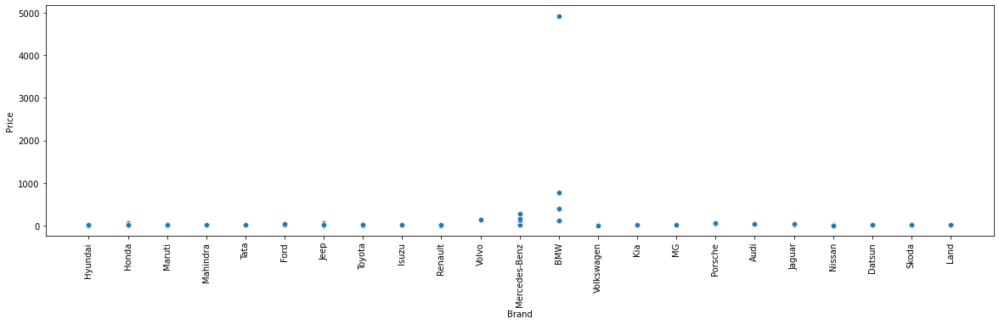

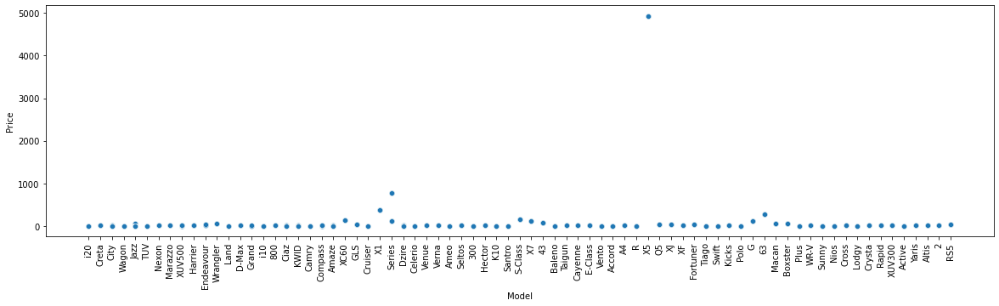

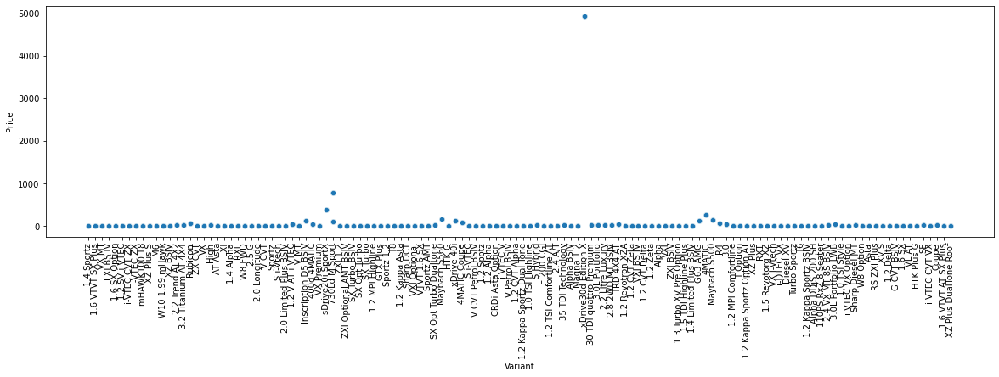

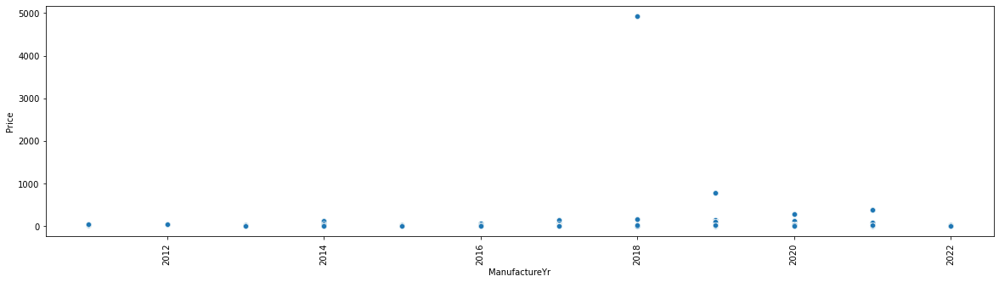

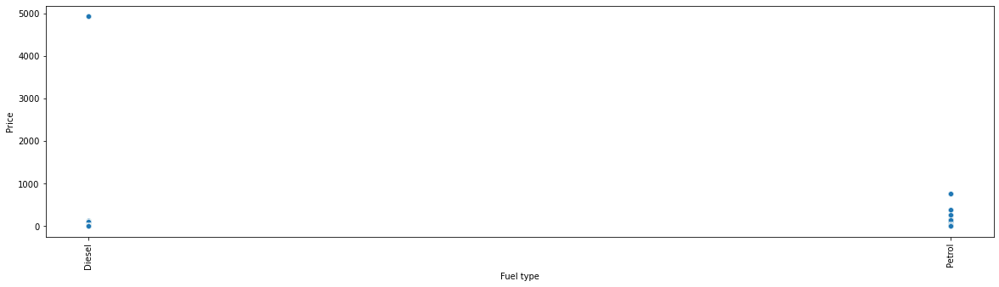

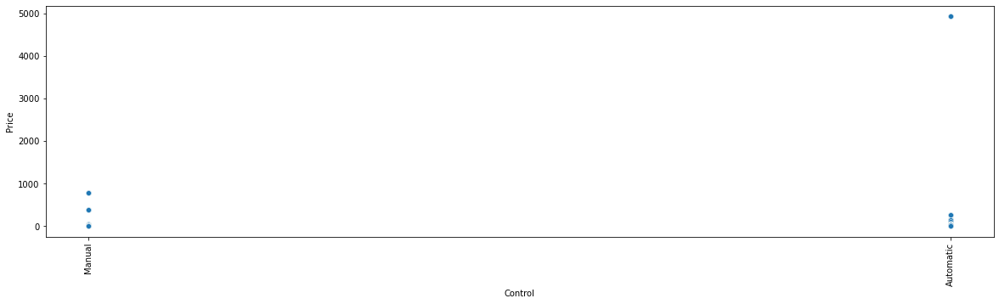

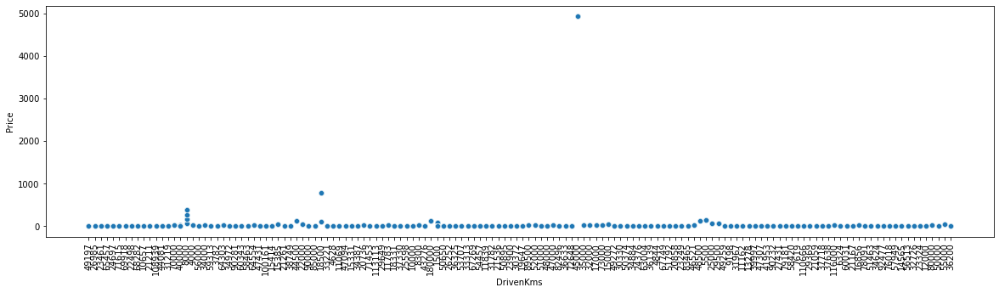

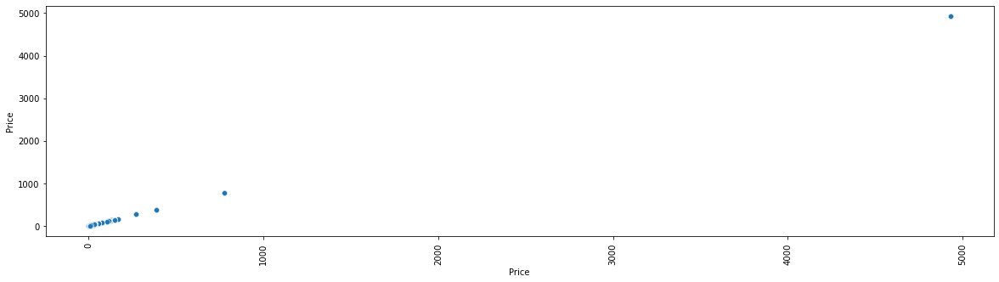

In [40]:
col=df.columns
#Plotting Scatter plot for each feature

for i in col:
    plt.figure(figsize=(20,5))
    a=sns.scatterplot(x=df[i],y=df['Price'],data=df)
    plt.xlabel(i)
    plt.xticks(rotation=90)
    plt.show()

## Encoding

In [48]:
category=df.drop(['Price','DrivenKms','ManufactureYr'],axis=1)
oe=OrdinalEncoder()
for i in category:
    df1=oe.fit_transform(df[[i]])
    df[i]=df1
df

,Brand,Model,Variant,ManufactureYr,Fuel type,Control,DrivenKms,Price
0,5.0,74.0,22.0,2017,0.0,1.0,49197.0,6.25
1,5.0,19.0,28.0,2018,1.0,1.0,26985.0,9.26
2,4.0,17.0,100.0,2020,1.0,1.0,23461.0,11.23
3,13.0,62.0,65.0,2016,1.0,1.0,65457.0,3.41
4,5.0,19.0,26.0,2019,1.0,1.0,24697.0,13.16
5,4.0,33.0,14.0,2016,1.0,1.0,71615.0,4.83
6,4.0,17.0,122.0,2019,1.0,0.0,69918.0,12.68
7,4.0,17.0,123.0,2019,1.0,1.0,22498.0,11.30
8,12.0,55.0,124.0,2017,0.0,1.0,68282.0,6.58
9,19.0,41.0,113.0,2021,1.0,1.0,10657.0,10.95


## Describing the data

In [49]:
df.describe()

,Brand,Model,Variant,ManufactureYr,Fuel type,Control,DrivenKms,Price
count,7200.000000,7200.000000,7200.000000,7200.000000,7200.000000,7200.000000,7200.000000,7200.000000
mean,10.376806,36.799028,62.685139,2017.404306,0.741667,0.663889,41662.894306,62.639339
std,5.882476,23.084564,38.205811,2.187428,0.437749,0.472410,27503.890348,449.746755
min,0.000000,0.000000,0.000000,2011.000000,0.000000,0.000000,1500.000000,1.080000
25%,5.000000,16.000000,27.000000,2016.000000,0.000000,0.000000,21167.000000,5.980000
50%,12.000000,35.000000,63.000000,2018.000000,1.000000,1.000000,36200.000000,8.500000
75%,14.000000,57.000000,98.000000,2019.000000,1.000000,1.000000,56513.000000,13.750000
max,22.000000,74.000000,127.000000,2022.000000,1.000000,1.000000,180000.000000,4931.000000


## Finding correlation between features

In [50]:
df.corr().abs()

,Brand,Model,Variant,ManufactureYr,Fuel type,Control,DrivenKms,Price
Brand,1.000000,0.214275,0.110552,0.132481,0.060371,0.081321,0.009781,0.151726
Model,0.214275,1.000000,0.090345,0.028257,0.074144,0.102724,0.143374,0.113449
Variant,0.110552,0.090345,1.000000,0.022880,0.057522,0.069336,0.151727,0.152735
ManufactureYr,0.132481,0.028257,0.022880,1.000000,0.082980,0.118215,0.394198,0.037831
Fuel type,0.060371,0.074144,0.057522,0.082980,1.000000,0.036832,0.183539,0.151838
Control,0.081321,0.102724,0.069336,0.118215,0.036832,1.000000,0.099512,0.153801
DrivenKms,0.009781,0.143374,0.151727,0.394198,0.183539,0.099512,1.000000,0.005459
Price,0.151726,0.113449,0.152735,0.037831,0.151838,0.153801,0.005459,1.000000


<AxesSubplot:>

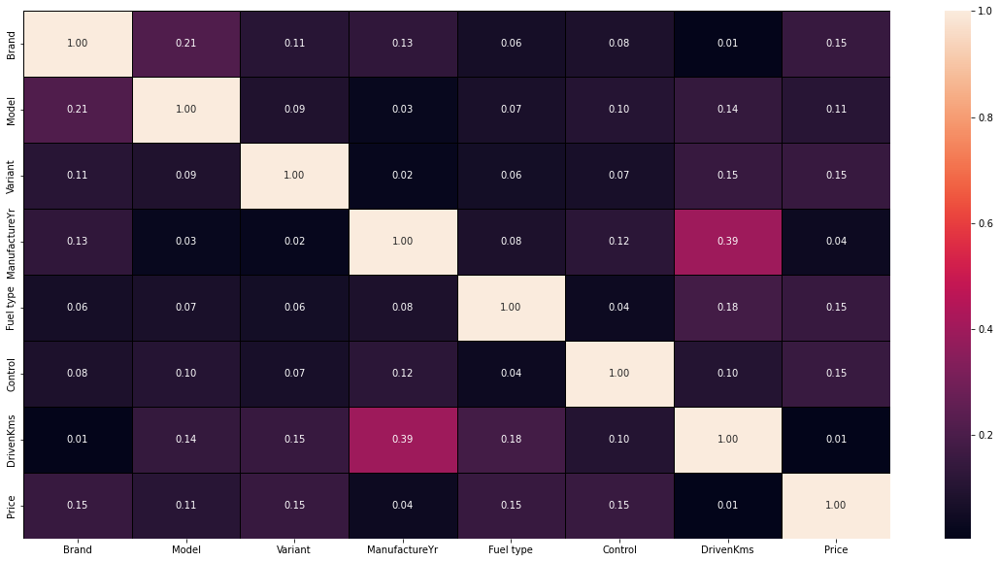

In [51]:
# Plotting heat map for better analysis
plt.figure(figsize=(20,10))
sns.heatmap(df.corr().abs(),annot=True,linewidth=0.5,linecolor='black',fmt='.2f')

We cannot observe any multicollinearity but still to be sure lets find the vif score.

## VIF

In [52]:
vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(df.values,i) for i in range(len(df.columns))]
vif['features']=df.columns
vif

,vif,features
0,4.519244,Brand
1,3.986831,Model
2,3.954294,Variant
3,20.229171,ManufactureYr
4,4.200896,Fuel type
5,3.194432,Control
6,3.652513,DrivenKms
7,1.124584,Price


vif score of ManufactureYr>10 so it is having collinearity with any other feature so if we found skewness or outlier in this, then we would drop this feature.

## Checking outliers

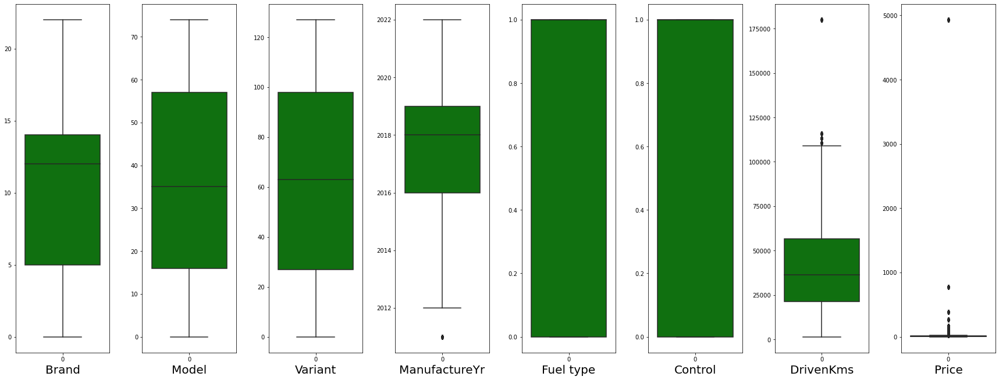

In [56]:
col=df.columns
plt.figure(figsize=(30,90))
for i in range(len(col)):
    plt.subplot(10,10,i+1)
    sns.boxplot(data=df[col[i]],color='green',orient='v')
    plt.xlabel(col[i],fontsize=20)
    plt.tight_layout()

We could observe outliers in ManufactureYr and DrivenKms but to be sure we need to calculate z-score

## Checking skewness

In [57]:
df.skew()

Brand             0.154527
Model             0.196101
Variant          -0.008555
ManufactureYr    -0.457882
Fuel type        -1.104441
Control          -0.694034
DrivenKms         1.208040
Price            10.585203
dtype: float64

We could observe skewness in DrivenKms.

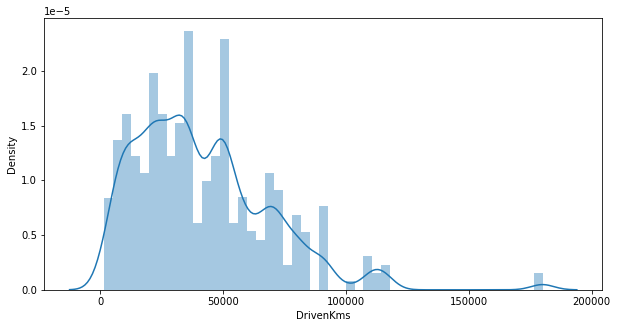

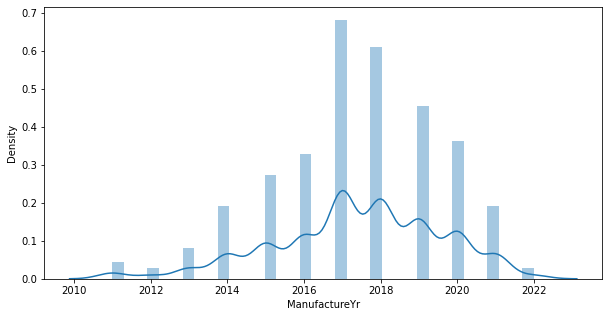

In [58]:
# Ploting Distribution plot to cross check skewness
import warnings
warnings.filterwarnings('ignore')
col=['DrivenKms','ManufactureYr']
# for feature Length
for i in range(2):
    plt.figure(figsize=(10,5))
    sns.distplot(df[col[i]])
    plt.xlabel(col[i],fontsize=10)

It is now confirmed that DrivenKms is right skewed and ManufactureYr being categorical data is neglected from skewness and outlier.

## Treating outliers

In [59]:
#Getting sure of outliers using z score

z=np.abs(zscore(df['DrivenKms']))
i=np.where(z>3)
print("Outliers index-\n",set(i[0]))
print("\n\nNumber of rows to be eliminated-\n",len(set(i[0])))

Outliers index-
 {898, 1538, 1158, 1418, 1038, 1298, 918, 1558, 1178, 1438, 1058, 1318, 938, 1578, 1198, 818, 1458, 1078, 1338, 958, 1598, 1218, 838, 1478, 1098, 1358, 978, 1238, 858, 1498, 1118, 1378, 998, 1258, 878, 1518, 1138, 1398, 1018, 1278}


Number of rows to be eliminated-
 40


In [60]:
df.shape

(7200, 8)

In [61]:
#Calculating Data Loss
loss=((7200-40)/7200)*100
print("The data loss-",100-loss,"%")

The data loss- 0.5555555555555571 %


We can bear with 0.5% data loss so lets drop these outlier rows.

In [62]:
#removing rows with outliers
df=df.drop(df.index[i[0]])
df

,Brand,Model,Variant,ManufactureYr,Fuel type,Control,DrivenKms,Price
0,5.0,74.0,22.0,2017,0.0,1.0,49197.0,6.25
1,5.0,19.0,28.0,2018,1.0,1.0,26985.0,9.26
2,4.0,17.0,100.0,2020,1.0,1.0,23461.0,11.23
3,13.0,62.0,65.0,2016,1.0,1.0,65457.0,3.41
4,5.0,19.0,26.0,2019,1.0,1.0,24697.0,13.16
5,4.0,33.0,14.0,2016,1.0,1.0,71615.0,4.83
6,4.0,17.0,122.0,2019,1.0,0.0,69918.0,12.68
7,4.0,17.0,123.0,2019,1.0,1.0,22498.0,11.30
8,12.0,55.0,124.0,2017,0.0,1.0,68282.0,6.58
9,19.0,41.0,113.0,2021,1.0,1.0,10657.0,10.95


In [63]:
df.shape

(7160, 8)

In [64]:
#Checking skewness again
df.skew()

Brand             0.153532
Model             0.208080
Variant          -0.006627
ManufactureYr    -0.451506
Fuel type        -1.095860
Control          -0.711705
DrivenKms         0.718491
Price            10.559595
dtype: float64

Skewness still persists in DrivenKms.

## Treating skewness

In [65]:
#using yeo-johnson transformation
df['DrivenKms']=power_transform(df[['DrivenKms']].to_numpy().reshape(-1,1),method='yeo-johnson')
df

,Brand,Model,Variant,ManufactureYr,Fuel type,Control,DrivenKms,Price
0,5.0,74.0,22.0,2017,0.0,1.0,0.474803,6.25
1,5.0,19.0,28.0,2018,1.0,1.0,-0.399018,9.26
2,4.0,17.0,100.0,2020,1.0,1.0,-0.570195,11.23
3,13.0,62.0,65.0,2016,1.0,1.0,0.983113,3.41
4,5.0,19.0,26.0,2019,1.0,1.0,-0.508670,13.16
5,4.0,33.0,14.0,2016,1.0,1.0,1.157500,4.83
6,4.0,17.0,122.0,2019,1.0,0.0,1.110279,12.68
7,4.0,17.0,123.0,2019,1.0,1.0,-0.619352,11.30
8,12.0,55.0,124.0,2017,0.0,1.0,1.064165,6.58
9,19.0,41.0,113.0,2021,1.0,1.0,-1.353676,10.95


In [66]:
#checking skewness again
df.skew()

Brand             0.153532
Model             0.208080
Variant          -0.006627
ManufactureYr    -0.451506
Fuel type        -1.095860
Control          -0.711705
DrivenKms        -0.072745
Price            10.559595
dtype: float64

## Standardization

In [67]:
x=df.drop(['Price'],axis=1)
y=df['Price']

In [68]:
scaler=StandardScaler()
x=scaler.fit_transform(x)
x

array([[-9.27043829e-01,  1.62144964e+00, -1.06094400e+00, ...,
        -1.68803506e+00,  7.05625928e-01,  4.74803186e-01],
       [-9.27043829e-01, -7.65325784e-01, -9.03110148e-01, ...,
         5.92404757e-01,  7.05625928e-01, -3.99017576e-01],
       [-1.09779561e+00, -8.52117617e-01,  9.90896042e-01, ...,
         5.92404757e-01,  7.05625928e-01, -5.70194846e-01],
       ...,
       [-1.78080271e+00,  4.49759889e-01, -2.19163469e-01, ...,
         5.92404757e-01, -1.41718148e+00,  6.65363395e-01],
       [-9.27043829e-01, -7.65325784e-01, -9.29415790e-01, ...,
         5.92404757e-01, -1.41718148e+00, -1.68391655e-03],
       [ 1.46348104e+00,  1.89384387e-01,  1.30656374e+00, ...,
         5.92404757e-01,  7.05625928e-01,  1.46032895e-01]])

## Train test split

In [69]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
max_ac=0
randomState=0
lr=LinearRegression()
for i in range(500):
    x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=i,test_size=0.20)
    lr.fit(x_train,y_train)
    pred_train=lr.predict(x_train)
    pred_test=lr.predict(x_test)
    if round(r2_score(y_train,pred_train)*100,1)==round(r2_score(y_test,pred_test)*100,1):
        print("\n\nAt random state:",i)
        print("\nTrain Accuracy- ",round(r2_score(y_train,pred_train)*100,1))
        print("\nTest Accuracy- ",round(r2_score(y_test,pred_test)*100,1))
        if round(r2_score(y_test,pred_test)*100,1)>max_ac:
            randomState=i
            max_ac=round(r2_score(y_test,pred_test)*100,1)
print("\n\n Best accuracy at random state-",randomState)



At random state: 43

Train Accuracy-  10.6

Test Accuracy-  10.6


At random state: 322

Train Accuracy-  10.6

Test Accuracy-  10.6


 Best accuracy at random state- 43


## Decision Tree Regressor

In [89]:
from sklearn.tree import DecisionTreeRegressor
dt=DecisionTreeRegressor()
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=100,test_size=0.20)
dt.fit(x_train,y_train)
dt_pred_train=dt.predict(x_train)
dt_pred_test=dt.predict(x_test)
dt_acc_train=r2_score(y_train,dt_pred_train)*100
dt_acc_test=r2_score(y_test,dt_pred_test)*100
print("acc train",dt_acc_train)
print("acc test",dt_acc_test)

acc train 99.9999993779874
acc test 100.0


## Cross Validation Score

In [90]:
for i in range(2,20):
    cv_score=cross_val_score(dt,x,y,cv=i)
    cv_mean=cv_score.mean()
    print("\n\nAt cv-",i)
    print("\n cross validation score is-",cv_mean*100)
    print("\n Accuracy score is-",dt_acc_test)



At cv- 2

 cross validation score is- 42.78504315117108

 Accuracy score is- 100.0


At cv- 3

 cross validation score is- -8860.305623565198

 Accuracy score is- 100.0


At cv- 4

 cross validation score is- -9043.395645481476

 Accuracy score is- 100.0


At cv- 5

 cross validation score is- -9447.799939464316

 Accuracy score is- 100.0


At cv- 6

 cross validation score is- -9959.831218763195

 Accuracy score is- 100.0


At cv- 7

 cross validation score is- 89.52245708582066

 Accuracy score is- 100.0


At cv- 8

 cross validation score is- 90.67685350352627

 Accuracy score is- 100.0


At cv- 9

 cross validation score is- 75.35139466070699

 Accuracy score is- 100.0


At cv- 10

 cross validation score is- 99.15189175583463

 Accuracy score is- 100.0


At cv- 11

 cross validation score is- 97.76651967013805

 Accuracy score is- 100.0


At cv- 12

 cross validation score is- 98.86745990905061

 Accuracy score is- 100.0


At cv- 13

 cross validation score is- 96.81629685567906

In [93]:
cv_score_best_dt=cross_val_score(dt,x,y,cv=19).mean()*100
print("cross validation score is-",cv_score_best_dt)
print("accuracy score for decision tree regression model is-",dt_acc_test)

cross validation score is- 99.999995733702
accuracy score for decision tree regression model is- 100.0


## Calculating RMSE,MAE,MSE Errors

In [92]:
dt_rmse=np.sqrt(mean_squared_error(y_test, dt_pred_test))
dt_mae=mean_absolute_error(y_test, dt_pred_test)
dt_mse=mean_squared_error(y_test,dt_pred_test)
print("RMSE::",np.sqrt(mean_squared_error(y_test, dt_pred_test)))
print("MAE::",mean_absolute_error(y_test, dt_pred_test))
print("MSE::",mean_squared_error(y_test,dt_pred_test))

RMSE:: 5.494963336934237e-15
MAE:: 3.378272211942498e-15
MSE:: 3.019462207425144e-29


## Random Forest Regressor

In [70]:
from sklearn.ensemble import RandomForestRegressor
rf=RandomForestRegressor()
max_ac=0
randomState=0

for i in range(20):
    x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=i,test_size=0.20)
    rf.fit(x_train,y_train)
    pred_train=rf.predict(x_train)
    pred_test=rf.predict(x_test)
    
    print("\n\nAt random state:",i)
    print("\nTrain Accuracy- ",round(r2_score(y_train,pred_train)*100,1))
    print("\nTest Accuracy- ",round(r2_score(y_test,pred_test)*100,1))
        
print("\n\n Best accuracy at random state-",randomState)



At random state: 0

Train Accuracy-  100.0

Test Accuracy-  100.0


At random state: 1

Train Accuracy-  100.0

Test Accuracy-  100.0


At random state: 2

Train Accuracy-  100.0

Test Accuracy-  100.0


At random state: 3

Train Accuracy-  100.0

Test Accuracy-  100.0


At random state: 4

Train Accuracy-  100.0

Test Accuracy-  100.0


At random state: 5

Train Accuracy-  100.0

Test Accuracy-  100.0


At random state: 6

Train Accuracy-  100.0

Test Accuracy-  100.0


At random state: 7

Train Accuracy-  100.0

Test Accuracy-  100.0


At random state: 8

Train Accuracy-  100.0

Test Accuracy-  100.0


At random state: 9

Train Accuracy-  100.0

Test Accuracy-  100.0


At random state: 10

Train Accuracy-  100.0

Test Accuracy-  100.0


At random state: 11

Train Accuracy-  100.0

Test Accuracy-  100.0


At random state: 12

Train Accuracy-  100.0

Test Accuracy-  100.0


At random state: 13

Train Accuracy-  100.0

Test Accuracy-  100.0


At random state: 14

Train Accuracy-  100.

In [72]:
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=12,test_size=0.20)
rf.fit(x_train,y_train)
pred_train=rf.predict(x_train)
pred_test=rf.predict(x_test)
rf_train_acc=round(r2_score(y_train,pred_train)*100,1)
rf_test_acc=round(r2_score(y_test,pred_test)*100,1)
print("\nTrain Accuracy- ",rf_train_acc)
print("\nTest Accuracy- ",rf_test_acc)


Train Accuracy-  100.0

Test Accuracy-  100.0


## Cross validation score

In [73]:
for i in range(4,23):
    cv_score=cross_val_score(rf,x,y,cv=i)
    cv_mean=cv_score.mean()
    print("\n\nAt cv-",i)
    print("\n cross validation score is-",cv_mean*100)
    print("\n Accuracy score is-",rf_test_acc)



At cv- 4

 cross validation score is- -2620.2656051849567

 Accuracy score is- 100.0


At cv- 5

 cross validation score is- -2339.625066029744

 Accuracy score is- 100.0


At cv- 6

 cross validation score is- -2933.9924649342775

 Accuracy score is- 100.0


At cv- 7

 cross validation score is- 89.18110549422477

 Accuracy score is- 100.0


At cv- 8

 cross validation score is- 90.5303935003908

 Accuracy score is- 100.0


At cv- 9

 cross validation score is- 76.41248900719104

 Accuracy score is- 100.0


At cv- 10

 cross validation score is- 98.80719126759963

 Accuracy score is- 100.0


At cv- 11

 cross validation score is- 98.70183410079109

 Accuracy score is- 100.0


At cv- 12

 cross validation score is- 98.38096432406397

 Accuracy score is- 100.0


At cv- 13

 cross validation score is- 98.40579199706751

 Accuracy score is- 100.0


At cv- 14

 cross validation score is- 98.10642657979275

 Accuracy score is- 100.0


At cv- 15

 cross validation score is- 97.833645532586

In [74]:
cv_score_best_rf=cross_val_score(rf,x,y,cv=22).mean()*100
print("cross validation score is-",cv_score_best_rf)
print("accuracy score for random forest regression model is-",rf_test_acc)

cross validation score is- 99.94368346009979
accuracy score for random forest regression model is- 100.0


## Calculating RMSE,MAE,MSE Errors

In [75]:
rf_rmse=np.sqrt(mean_squared_error(y_test, pred_test))
rf_mae=mean_absolute_error(y_test, pred_test)
rf_mse=mean_squared_error(y_test,pred_test)
print("RMSE::",np.sqrt(mean_squared_error(y_test, pred_test)))
print("MAE::",mean_absolute_error(y_test, pred_test))
print("MSE::",mean_squared_error(y_test,pred_test))

RMSE:: 1.0794830995527927e-14
MAE:: 7.244980531087404e-15
MSE:: 1.1652837622201047e-28


## Knn Regressor

In [76]:
from sklearn.neighbors import KNeighborsRegressor
knn=KNeighborsRegressor()
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=50,test_size=0.20)
knn.fit(x_train,y_train)
knn_pred_train=knn.predict(x_train)
knn_pred_test=knn.predict(x_test)
knn_acc_train=r2_score(y_train,knn_pred_train)
knn_acc_test=r2_score(y_test,knn_pred_test)
print("acc train",knn_acc_train*100)
print("acc test",knn_acc_test*100)

acc train 99.99999921879663
acc test 99.99998186420095


## Cross validation Score

In [77]:
for i in range(10,20):
    cv_score=cross_val_score(knn,x,y,cv=i)
    cv_mean=cv_score.mean()
    print("\n\nAt cv-",i)
    print("\n cross validation score is-",cv_mean*100)
    print("\n Accuracy score is-",knn_acc_test*100)



At cv- 10

 cross validation score is- 99.5273036765209

 Accuracy score is- 99.99998186420095


At cv- 11

 cross validation score is- 99.932134774835

 Accuracy score is- 99.99998186420095


At cv- 12

 cross validation score is- 99.91785718001786

 Accuracy score is- 99.99998186420095


At cv- 13

 cross validation score is- 99.90323012933938

 Accuracy score is- 99.99998186420095


At cv- 14

 cross validation score is- 99.87558503314008

 Accuracy score is- 99.99998186420095


At cv- 15

 cross validation score is- 98.6808670009452

 Accuracy score is- 99.99998186420095


At cv- 16

 cross validation score is- 97.27113388780938

 Accuracy score is- 99.99998186420095


At cv- 17

 cross validation score is- 92.21056679648724

 Accuracy score is- 99.99998186420095


At cv- 18

 cross validation score is- 88.24722637818022

 Accuracy score is- 99.99998186420095


At cv- 19

 cross validation score is- 94.57402904240384

 Accuracy score is- 99.99998186420095


In [78]:
cv_score_best_knn=cross_val_score(knn,x,y,cv=11).mean()*100
print("cross validation score is-",cv_score_best_knn)
print("accuracy score for K Nearest classifier model is-",knn_acc_test*100)

cross validation score is- 99.932134774835
accuracy score for K Nearest classifier model is- 99.99998186420095


## Calculating RMSE,MAE,MSE Errors

In [79]:
knn_rmse=np.sqrt(mean_squared_error(y_test, knn_pred_test))
knn_mae=mean_absolute_error(y_test, knn_pred_test)
knn_mse=mean_squared_error(y_test,knn_pred_test)
print("RMSE::",np.sqrt(mean_squared_error(y_test, knn_pred_test)))
print("MAE::",mean_absolute_error(y_test, knn_pred_test))
print("MSE::",mean_squared_error(y_test,knn_pred_test))

RMSE:: 0.18418797326971895
MAE:: 0.004867318435754245
MSE:: 0.033925209497206704


## XGBoost Regressor

In [80]:
from xgboost import XGBRegressor
xgmod=XGBRegressor()
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=100,test_size=0.20)
xgmod.fit(x_train,y_train)
pred_train=xgmod.predict(x_train)
pred_test=xgmod.predict(x_test)
xg_train_acc=round(r2_score(y_train,pred_train)*100,1)
xg_test_acc=round(r2_score(y_test,pred_test)*100,1)
print("\nTrain Accuracy- ",xg_train_acc)
print("\nTest Accuracy- ",xg_test_acc)


Train Accuracy-  100.0

Test Accuracy-  100.0


## Cross Validation Score

In [81]:
cv_score_best_xg=cross_val_score(xgmod,x,y,cv=20).mean()*100
print("cross validation score is-",cv_score_best_xg)
print("accuracy score for Knn classifier model is-",xg_test_acc)

cross validation score is- 99.99988634635048
accuracy score for Knn classifier model is- 100.0


## Calculating RMSE,MAE,MSE Errors

In [82]:
xgb_rmse=np.sqrt(mean_squared_error(y_test, pred_test))
xgb_mae=mean_absolute_error(y_test, pred_test)
xgb_mse=mean_squared_error(y_test,pred_test)
print("RMSE::",np.sqrt(mean_squared_error(y_test, pred_test)))
print("MAE::",mean_absolute_error(y_test, pred_test))
print("MSE::",mean_squared_error(y_test,pred_test))

RMSE:: 0.0012174487505740208
MAE:: 0.0008198481198795449
MSE:: 1.4821814602742441e-06


## Model Summary

In [94]:
models=['Dscision Tree Regressor','Random Forest Regressor','Knn Regressor','XGBoost']
test_acc=[dt_acc_test,rf_test_acc,knn_acc_test*100,xg_test_acc]
cv_score=[cv_score_best_dt,cv_score_best_rf,cv_score_best_knn,cv_score_best_xg]
rmse=[dt_rmse,rf_rmse,knn_rmse,xgb_rmse]
mae=[dt_mae,rf_mae,knn_mae,xgb_mae]
mse=[dt_mse,rf_mse,knn_mse,xgb_mse]
dfm=pd.DataFrame(list(zip(models,test_acc,cv_score,rmse,mae,mse)),columns=['Models','Test Accuracy','CV Score','RMSE','MAE','MSE'])
dfm

,Models,Test Accuracy,CV Score,RMSE,MAE,MSE
0,Dscision Tree Regressor,100.000000,99.999996,5.494963e-15,3.378272e-15,3.019462e-29
1,Random Forest Regressor,100.000000,99.943683,1.079483e-14,7.244981e-15,1.165284e-28
2,Knn Regressor,99.999982,99.932135,1.841880e-01,4.867318e-03,3.392521e-02
3,XGBoost,100.000000,99.999886,1.217449e-03,8.198481e-04,1.482181e-06


The best performing model is random forest Regressor as its test accuracy and CV score bothare almost same. The Root mean square error, mean absolute error and mean square error is least for random forest regressor so we will finalize this model.

Since the accuracy is at its best so we dont need to perform hyper parameter tuning on it. so lets save our model.

## Model Saving

In [95]:
import pickle
filename = 'finalized_model.pkl'
pickle.dump(rf, open(filename, 'wb'))